# Cross-validation

- entainement du mofèle sur toutes les différentes parties
- moyenne de nos modèles sur toutes ces parties puis moyenne sur l'ensemble des test
- un modèle meilleur que l'autre ressort

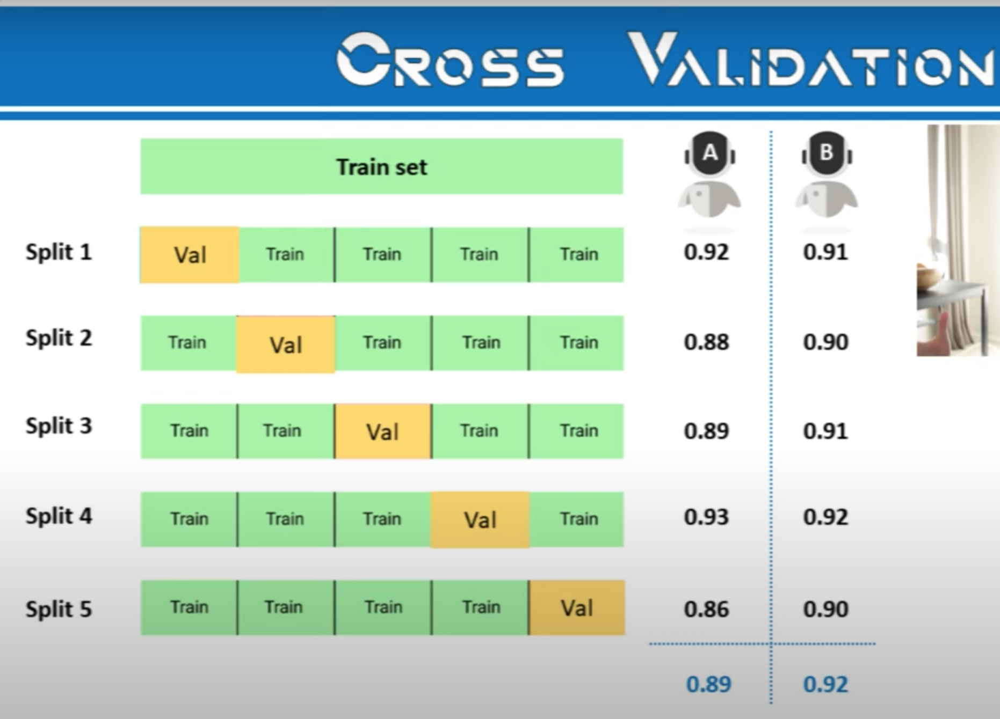

## différentes manières de découpe le train set

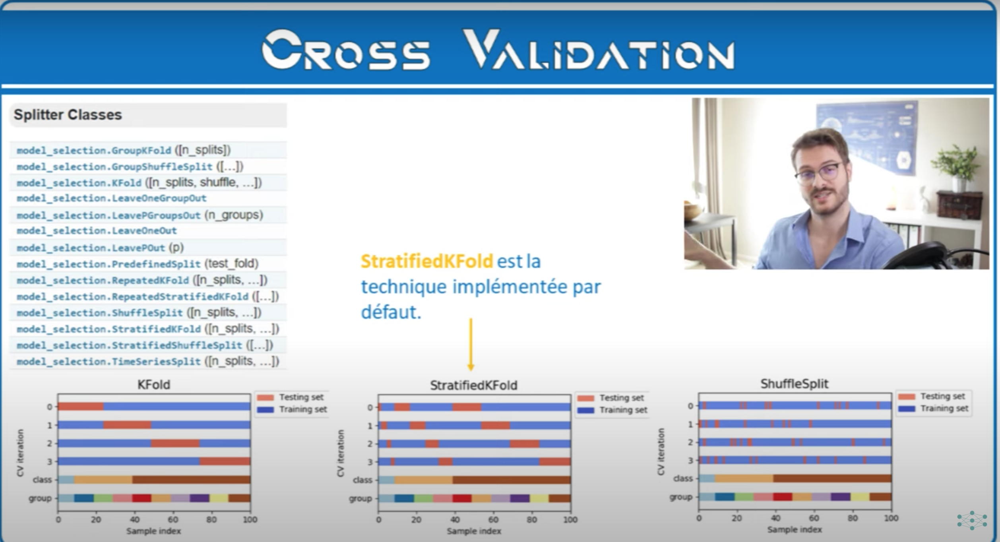

In [38]:
from sklearn.model_selection import train_test_split
import numpy as np
import pandas as pd
from  sklearn.neighbors import KNeighborsClassifier
import matplotlib.pyplot as plt

iris = pd.read_csv('../seaborn/iris.csv')
iris.head()
y = iris[['species']]
X = iris.drop('species', axis=1)
Y = y['species'].astype('category').cat.codes
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2)

In [39]:
from sklearn.model_selection import cross_val_score

# 3 k voisin, 5 étape de cross validation 
# on obtient 5 score pour nos 5 split de cross validation
cross_val_score(KNeighborsClassifier(3), X_train, y_train, cv=5, scoring='accuracy')

array([0.95833333, 1.        , 0.83333333, 1.        , 0.95833333])

In [40]:
# on en fait la moyenne comme vu précédemment
cross_val_score(KNeighborsClassifier(3), X_train, y_train, cv=5, scoring='accuracy').mean()

0.95

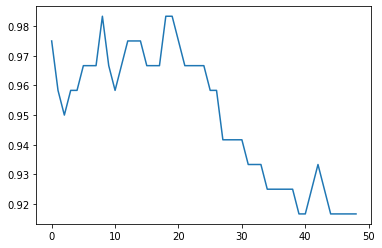

In [41]:
# on peut maintenant comparé ce model avec différents nombre de k voisin en utilisant matplotlib et une boucle
val_score = []
# de 1 à 50
for k in range(1, 50):
    score = cross_val_score(KNeighborsClassifier(k), X_train, y_train, cv=5, scoring='accuracy').mean()
    val_score.append(score)

plt.plot(val_score)

# Validation Curve

In [43]:
# validation curve fait exactement la boucle que l'on vient de faire
from sklearn.model_selection import validation_curve
model = KNeighborsClassifier()
k = np.arange(1, 50)
train_score, val_score = validation_curve(model, X_train, y_train, 'n_neighbors', k, cv=5)

print(val_score)

[[0.95833333 1.         0.95833333 1.         0.95833333]
 [0.91666667 1.         0.875      1.         1.        ]
 [0.95833333 1.         0.83333333 1.         0.95833333]
 [0.95833333 1.         0.875      1.         0.95833333]
 [0.95833333 1.         0.875      1.         0.95833333]
 [0.95833333 1.         0.91666667 1.         0.95833333]
 [0.95833333 1.         0.91666667 1.         0.95833333]
 [0.95833333 1.         0.91666667 1.         0.95833333]
 [0.95833333 1.         0.95833333 1.         1.        ]
 [0.95833333 1.         0.91666667 1.         0.95833333]
 [0.95833333 1.         0.875      1.         0.95833333]
 [0.95833333 1.         0.91666667 1.         0.95833333]
 [0.95833333 1.         0.91666667 1.         1.        ]
 [0.95833333 1.         0.91666667 1.         1.        ]
 [0.95833333 1.         0.91666667 1.         1.        ]
 [0.95833333 1.         0.91666667 0.95833333 1.        ]
 [0.95833333 1.         0.875      1.         1.        ]
 [0.95833333 1

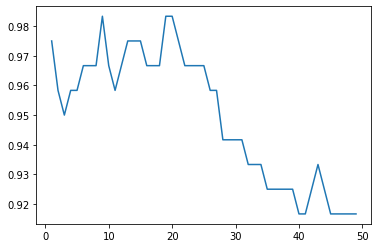

In [44]:
plt.plot(k, val_score.mean(axis=1))

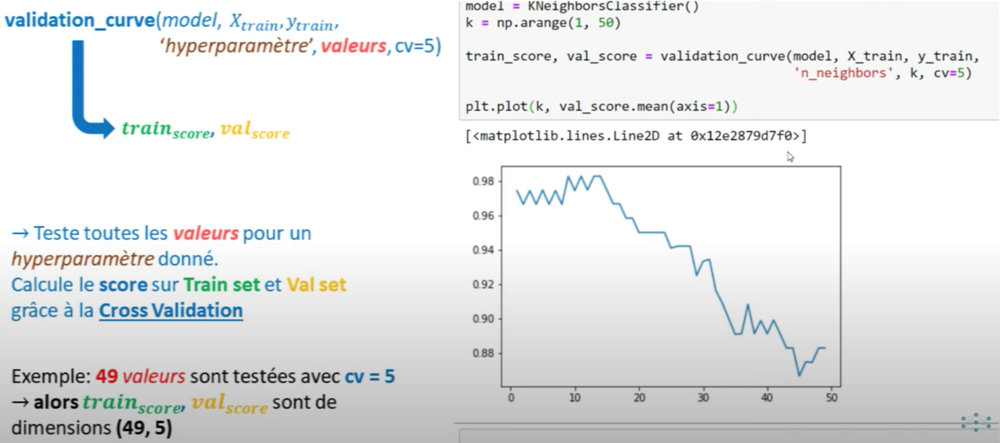

# GridSearchCV

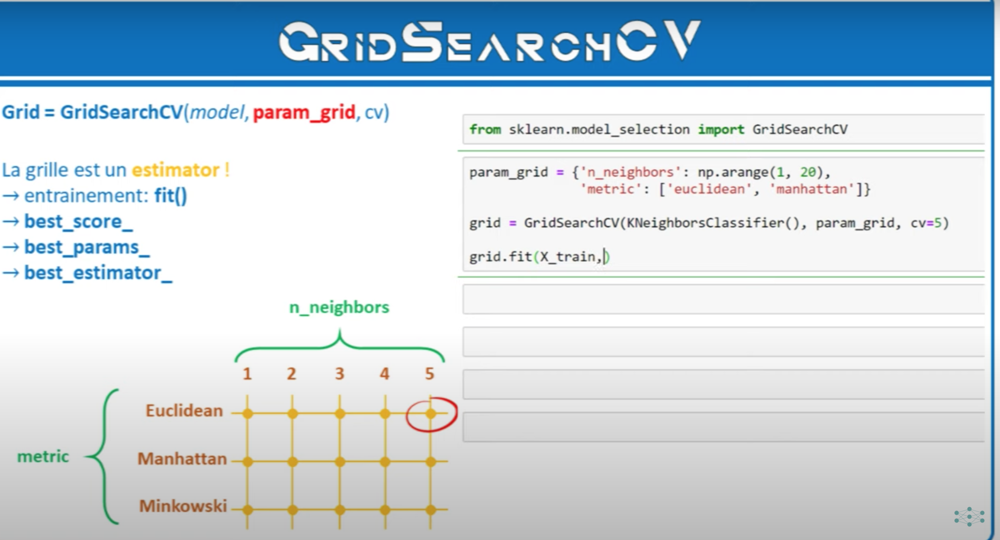

In [45]:
from sklearn.model_selection import GridSearchCV

# on setup les autres hyper paramètres de notre algorithme
param_grid = {'n_neighbors': np.arange(1, 20),
             'metric': ['euclidean', 'manhattan']}

grid = GridSearchCV(KNeighborsClassifier(), param_grid, cv=5)
grid.fit(X_train, y_train)

GridSearchCV(cv=5, error_score=nan,
             estimator=KNeighborsClassifier(algorithm='auto', leaf_size=30,
                                            metric='minkowski',
                                            metric_params=None, n_jobs=None,
                                            n_neighbors=5, p=2,
                                            weights='uniform'),
             iid='deprecated', n_jobs=None,
             param_grid={'metric': ['euclidean', 'manhattan'],
                         'n_neighbors': array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19])},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring=None, verbose=0)

In [46]:
# le meilleur score que l'on a obtenue
grid.best_score_

0.9833333333333334

In [47]:
# les meilleurs paramètres
grid.best_params_

{'metric': 'euclidean', 'n_neighbors': 9}

In [48]:
model = grid.best_estimator_
model.score(X_test, y_test)

0.9

# Confusion Matrix
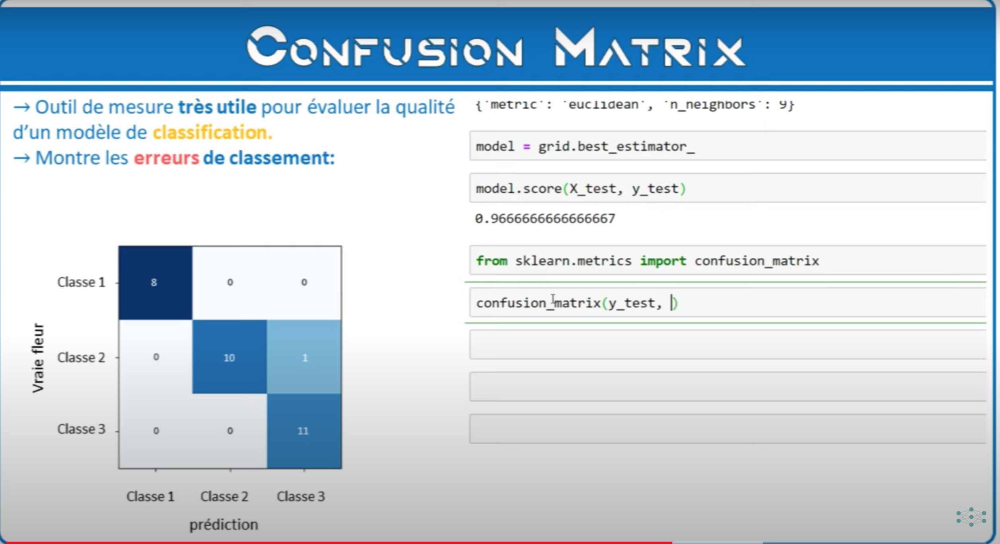

In [49]:
# matrice carré d'ordre 3 car 3 classes de fleurs dans notre dataset
from sklearn.metrics import confusion_matrix
confusion_matrix(y_test, model.predict(X_test))
# les 11 fleurs de la classe 1 ont bien été classé
# pour a classe 2 10 fleurs sur 12 ont bien été classé
# pour la classe 3 le classage est très bien

array([[ 8,  0,  0],
       [ 0,  9,  1],
       [ 0,  2, 10]])

# learning_curve

## permet de déterminer si on aurait un meilleur résultat si on avait plus de données

arrêter de récolter des données quand on arrive au plafond de données

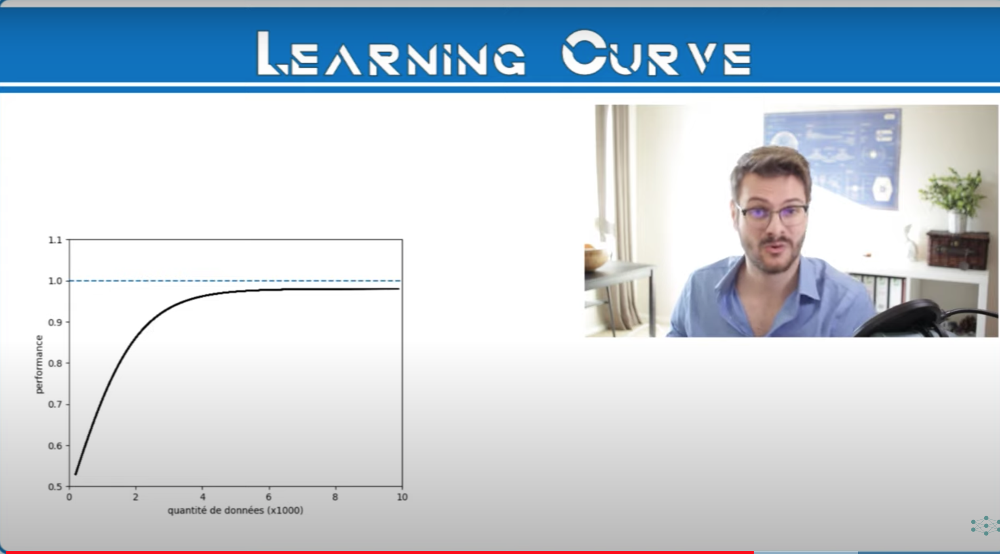

[ 9 19 28 38 48 57 67 76 86 96]


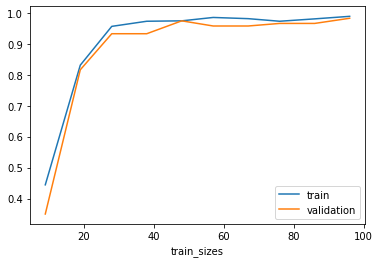

In [51]:
from sklearn.model_selection import learning_curve
# on passe les quantités de données en indiquant des pourcentages
# si mon dataset contient 100 exemples alors on va voir graçe au graphe l'évolution
# de la perf de notre modèle en fonction des pourventages
# N représente un tableau de points
N , train_score, val_score = learning_curve(model, X_train, y_train, train_sizes=np.linspace(0.1, 1.0, 10), cv=5)
print(N)
plt.plot(N, train_score.mean(axis=1), label='train')
plt.plot(N, val_score.mean(axis=1), label='validation')
plt.xlabel('train_sizes')
plt.legend()

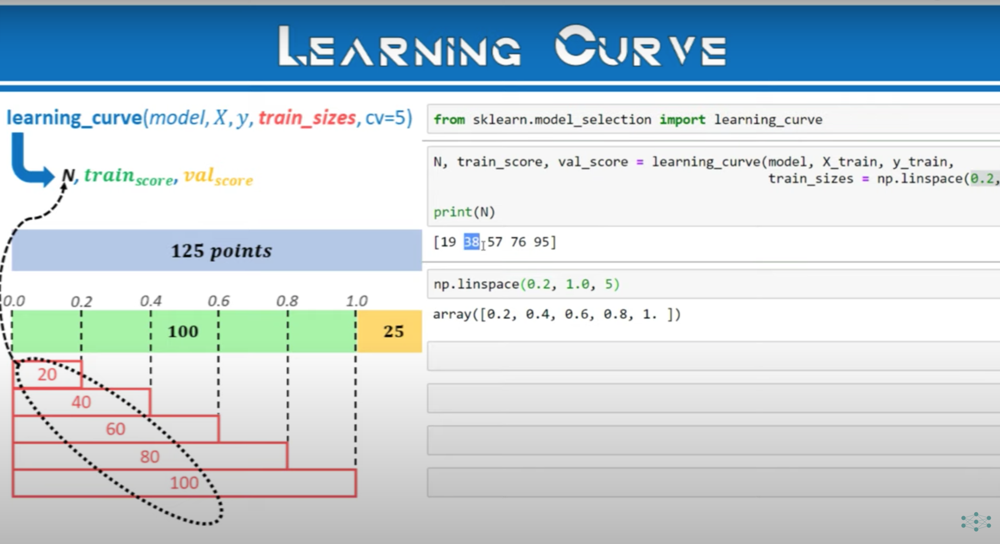